In [85]:
import numpy as np
import glob, os, json
import pickle

import matplotlib.pyplot as plt
import corner
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import multiprocessing as mp

import os, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import healpy as hp
import time
import scipy
from scipy import integrate as spint

import skyplot_tools as spt
from corner import corner

from astropy.time import Time
from matplotlib.colors import LogNorm
from matplotlib.colors import Normalize


from enterprise.pulsar import Pulsar

from la_forge.core import Core
from la_forge.diagnostics import plot_chains

nano12_pkl = '/home/nima/nanograv/12p5yr_bwm/channelized_12yr_v3_partim_py3.pkl'
with open(nano12_pkl, 'rb') as f:
    allpsrs=pickle.load(f)

In [74]:
# print out when the last pulsar was added to the PTA
print(max([p.toas.min() for p in allpsrs])/(3600*24))

56668.80272492578


In [75]:
def figsize(scale):
    fig_width_pt = 513.17 #469.755                  # Get this from LaTeX using \the\textwidth
    inches_per_pt = 1.0/72.27                       # Convert pt to inch
    #golden_mean = (np.sqrt(5.0)-1.0)/2.0            # Aesthetic ratio (you could change this)
    golden_mean= 0.3333
    fig_width = fig_width_pt*inches_per_pt*scale    # width in inches
    fig_height = fig_width*golden_mean              # height in inches
    fig_size = [fig_width,fig_height]
    return fig_size
plt.rcParams.update(plt.rcParamsDefault)

params = {'backend': 'pdf',
        'axes.labelsize': 10,
        'lines.markersize': 4,
        'font.size': 10,
        'xtick.major.size':6,
        'xtick.minor.size':3,  
        'ytick.major.size':6,
        'ytick.minor.size':3, 
        'xtick.major.width':0.5,
        'ytick.major.width':0.5,
        'xtick.minor.width':0.5,
        'ytick.minor.width':0.5,
        'lines.markeredgewidth':1,
        'axes.linewidth':1.2,
        'legend.fontsize': 7,
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'savefig.dpi':200,
        'path.simplify':True,
        'font.family': 'serif',
        #'font.serif':'Times',
        'text.latex.preamble': [r'\usepackage{amsmath}'],
        'text.usetex':True,
        'figure.figsize': figsize(0.98)}

plt.rcParams.update(params)

/home/nima/anaconda3/envs/nano15/lib/python3.8/_collections_abc.py:832: MatplotlibDeprecationWarning: Support for setting the 'text.latex.preamble' or 'pgf.preamble' rcParam to a list of strings is deprecated since 3.3 and will be removed two minor releases later; set it to a single string instead.
  self[key] = other[key]


# Resample from Charts

In [14]:
chartdir= '/home/nima/nanograv/12p5yr_bwm/ULvSky_charts_crnmarg_polmarged/'

charts=os.listdir(chartdir)

#print(sorted(charts))
print(len(charts))

768


In [15]:
import random
def sample_hist(weights, centers, num_points=int(1e5), sample_bounds=None, verbose=False):
    #make sure the weights are properly normalized
    #print(weights)
    #print(centers)
    norm = np.sum(weights)
    normed_weights = weights/norm
    #print(normed_weights)
    
    #go through weights and see if there are lower and upper bounds. This will speed up resampling
    
            
            
    #print("lower, upper bounds are: {} and {}\nthe likelihoods between are {}:".format(lower, upper, normed_weights[lower:upper]))    
    
    
    accepted = 0
    
    resampled_chain = []    
    likelihood_interp = scipy.interpolate.interp1d(centers, normed_weights)
    if sample_bounds is None:
        while accepted < num_points:
            amp = random.uniform(centers[0], centers[-1])
            #print("trying amplitude: {}".format(amp))

            likelihood = likelihood_interp(amp)
            #print(likelihood)
            #print("likelihood of amp = {}".format(likelihood))
            if random.random() < likelihood:
                accepted+=1
                if accepted/num_points % 0.02 == 0 and verbose:
                    print("completed {}%".format(accepted/num_points * 100))
                resampled_chain.append(amp)
    else:
        while accepted < num_points:
            amp = random.uniform(sample_bounds[0], sample_bounds[1])
            #print("trying amplitude: {}".format(amp))

            likelihood = likelihood_interp(amp)
            #print(likelihood)
            #print("likelihood of amp = {}".format(likelihood))
            if random.random() < likelihood:
                accepted+=1
                if accepted/num_points % 0.02 == 0 and verbose:
                    print("completed {}%".format(accepted/num_points * 100))
                resampled_chain.append(amp)

        
    #print(sorted(resampled_chain))
    return sorted(resampled_chain)

In [104]:
import multiprocessing as mp
def resample_worker(skypix, sample=False):
    chartdir = '/home/nima/nanograv/12p5yr_bwm/ULvSky_charts_crnmarg_polmarged/'
    skypix_hist_outdir = '/home/nima/nanograv/12p5yr_bwm/ULvSky_samples_crnmarg/'

    outf = skypix_hist_outdir + "{}_hist.txt".format(skypix)
    os.makedirs(skypix_hist_outdir, exist_ok=True)
    
    amps = np.linspace(-17,-11,45, endpoint=True)
    nano12_Ts = np.linspace(53216.13175403865+180, 57933.45642396011-180, 157)

    min_idx = np.argmin(np.abs(nano12_Ts - 56750))
    max_idx = np.argmin(np.abs(nano12_Ts - 57750))
    
    cols=np.arange(min_idx, max_idx)
    
    curr_chart = np.loadtxt(chartdir + '{}.txt'.format(skypix))
    amp_logpost = np.zeros(len(amps))
    for amp_idx, amp in enumerate(amps):
        t0_loglikes = curr_chart[amp_idx, min_idx:max_idx]
        max_loglike = np.amax(t0_loglikes)
        reduced_t0_likes = np.exp(t0_loglikes - max_loglike)
        #marginalize 
        t0_marged = spint.simpson(reduced_t0_likes, cols)
        if np.isnan(t0_marged):
            amp_logpost[amp_idx] = np.NINF
        else:
            this_amp_loglike = np.log((10**amp) * t0_marged) + max_loglike
            amp_logpost[amp_idx] = this_amp_loglike

    amp_post = np.exp(amp_logpost - np.amax(amp_logpost))
    # Now we have the final amplitude logposterior and need to resample it.
    # let's rewrite things in terms of weights and centers
    centers=amps
    weights = amp_post
    for amp_idx, amp in enumerate(amps):
        weights[amp_idx] *= 10**(amp) #factor for uniform bit
    if sample:
        #sample
        start=time.time()
        print("starting sampling for {}".format(skypix))
        this_skypix_hist = sample_hist(weights, centers, num_points=1000, sample_bounds=None, verbose=False)
        # Now this skypix has samples from each polarization bin. Let's save it.
        print("Completed skypix {} in {} seconds".format(skypix, time.time()-start))
        np.savetxt(outf, this_skypix_hist)
    else:
        #Just plot
        plt.scatter(centers,weights)
        plt.title('skypix {}'.format(skypix))
        plt.show()
        plt.close

In [105]:
sample = True
args = []
nside=8
npix = hp.nside2npix(nside)
skypixes = np.arange(npix)
for i in range(len(skypixes)):
    args.append([i, sample])
p = mp.Pool(processes=15)
p.starmap(resample_worker, args)

/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)


starting sampling for 0


/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)
/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)
/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)
/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)
/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)
/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)
/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes 

starting sampling for 26starting sampling for 78

/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)


starting sampling for 52starting sampling for 130starting sampling for 182starting sampling for 39starting sampling for 117starting sampling for 104starting sampling for 91
starting sampling for 156





/tmp/ipykernel_31344/2660825539.py:22: RuntimeWarning: invalid value encountered in subtract
  reduced_t0_likes = np.exp(t0_loglikes - max_loglike)



starting sampling for 65


starting sampling for 143

starting sampling for 13

starting sampling for 169
Completed skypix 0 in 0.9599528312683105 seconds
starting sampling for 1
Completed skypix 143 in 1.113957166671753 seconds
Completed skypix 78 in 1.163069725036621 seconds
starting sampling for 144
starting sampling for 79
Completed skypix 52 in 1.237978458404541 secondsCompleted skypix 182 in 1.2499427795410156 secondsCompleted skypix 117 in 1.246690034866333 secondsCompleted skypix 65 in 1.2514629364013672 seconds



Completed skypix 26 in 1.257641315460205 secondsCompleted skypix 130 in 1.2543623447418213 seconds

starting sampling for 53
starting sampling for 66Completed skypix 91 in 1.2728636264801025 secondsstarting sampling for 27

Completed skypix 169 in 1.2863655090332031 secondsstarting sampling for 183
starting sampling for 131Completed skypix 104 in 1.2937791347503662 seconds



Completed skypix 39 in 1.2950265407562256 seconds
starting sampling for 105starting samplin

Completed skypix 72 in 1.246999740600586 seconds
starting sampling for 73
Completed skypix 150 in 1.2984223365783691 seconds
starting sampling for 151
Completed skypix 20 in 1.3452355861663818 seconds
Completed skypix 33 in 1.3275351524353027 secondsstarting sampling for 21

starting sampling for 34
Completed skypix 137 in 1.2976722717285156 seconds
starting sampling for 138Completed skypix 98 in 1.331247091293335 seconds

starting sampling for 99Completed skypix 163 in 1.2387642860412598 seconds

Completed skypix 46 in 1.333078384399414 secondsstarting sampling for 164

Completed skypix 189 in 1.3195886611938477 secondsstarting sampling for 47Completed skypix 176 in 1.0397014617919922 seconds


starting sampling for 190
starting sampling for 177
Completed skypix 111 in 1.328587532043457 secondsCompleted skypix 85 in 1.3083229064941406 seconds

Completed skypix 124 in 1.2848014831542969 seconds
starting sampling for 86starting sampling for 112starting sampling for 125


Completed skypi

starting sampling for 262
Completed skypix 377 in 1.563110113143921 seconds
starting sampling for 378
Completed skypix 274 in 1.255291223526001 seconds
starting sampling for 275
Completed skypix 287 in 1.2618522644042969 seconds
starting sampling for 288
Completed skypix 313 in 1.1704657077789307 seconds
Completed skypix 300 in 1.2237379550933838 seconds
starting sampling for 314starting sampling for 301

Completed skypix 326 in 1.3017420768737793 seconds
Completed skypix 339 in 1.2024967670440674 seconds
starting sampling for 327
starting sampling for 340
Completed skypix 210 in 1.2229316234588623 seconds
starting sampling for 211
Completed skypix 365 in 1.147383213043213 seconds
Completed skypix 223 in 1.3122987747192383 secondsstarting sampling for 366
Completed skypix 352 in 1.2788920402526855 seconds
starting sampling for 224Completed skypix 197 in 1.338789463043213 seconds


starting sampling for 353
starting sampling for 198
Completed skypix 262 in 0.9426863193511963 seconds
sta

Completed skypix 242 in 1.0994391441345215 seconds
starting sampling for 243
Completed skypix 281 in 1.198737382888794 seconds
starting sampling for 282
Completed skypix 307 in 1.1851089000701904 seconds
starting sampling for 308
Completed skypix 269 in 1.3294589519500732 seconds
starting sampling for 270
Completed skypix 333 in 1.3266472816467285 seconds
starting sampling for 334
Completed skypix 230 in 1.3312296867370605 seconds
starting sampling for 231Completed skypix 320 in 1.3245208263397217 seconds

Completed skypix 346 in 1.2156479358673096 seconds
Completed skypix 372 in 1.3387928009033203 secondsstarting sampling for 321

Completed skypix 217 in 1.2305817604064941 seconds
Completed skypix 359 in 1.1978726387023926 seconds
starting sampling for 347starting sampling for 373starting sampling for 218


starting sampling for 360
Completed skypix 204 in 1.2797889709472656 seconds
starting sampling for 205
Completed skypix 385 in 1.2423193454742432 seconds
Completed skypix 256 in 1.

Completed skypix 547 in 1.2375495433807373 secondsstarting sampling for 420
starting sampling for 458

Completed skypix 394 in 1.3307881355285645 seconds
starting sampling for 395Completed skypix 560 in 1.1503119468688965 secondsstarting sampling for 548


Completed skypix 496 in 1.2385365962982178 seconds
starting sampling for 561
starting sampling for 497
Completed skypix 432 in 1.2518844604492188 seconds
starting sampling for 433
Completed skypix 509 in 1.321528434753418 seconds
starting sampling for 510
Completed skypix 573 in 1.3176884651184082 seconds
starting sampling for 574
Completed skypix 522 in 1.1364257335662842 seconds
starting sampling for 523
Completed skypix 445 in 1.2651476860046387 seconds
starting sampling for 446
Completed skypix 484 in 1.0144059658050537 seconds
Completed skypix 535 in 1.3146142959594727 secondsstarting sampling for 485

starting sampling for 536
Completed skypix 471 in 1.3698933124542236 seconds
Completed skypix 458 in 1.1686408519744873 seconds


starting sampling for 530Completed skypix 401 in 1.2429955005645752 seconds

starting sampling for 402Completed skypix 567 in 1.2808268070220947 seconds

Completed skypix 554 in 1.2871887683868408 seconds
starting sampling for 568
starting sampling for 555
Completed skypix 503 in 1.3051996231079102 seconds
starting sampling for 504
Completed skypix 426 in 1.2475016117095947 seconds
Completed skypix 452 in 1.2717339992523193 secondsstarting sampling for 427

starting sampling for 453Completed skypix 516 in 1.3443124294281006 seconds

starting sampling for 517
Completed skypix 491 in 1.2288963794708252 seconds
starting sampling for 492
Completed skypix 580 in 1.3346302509307861 seconds
starting sampling for 581
Completed skypix 440 in 1.1067049503326416 seconds
starting sampling for 441
Completed skypix 542 in 1.3689346313476562 seconds
starting sampling for 543
Completed skypix 465 in 1.2825336456298828 seconds
starting sampling for 466
Completed skypix 478 in 1.1748087406158447 seconds

Completed skypix 756 in 1.2523901462554932 seconds

starting sampling for 680
starting sampling for 757
Completed skypix 654 in 1.2354209423065186 seconds
starting sampling for 655
Completed skypix 590 in 1.1873223781585693 seconds
starting sampling for 591
Completed skypix 718 in 1.1842503547668457 seconds
starting sampling for 719
Completed skypix 641 in 1.272451400756836 seconds
starting sampling for 642
Completed skypix 731 in 1.2359123229980469 seconds
starting sampling for 732
Completed skypix 616 in 1.2106037139892578 seconds
Completed skypix 667 in 1.35160231590271 seconds
starting sampling for 617
Completed skypix 603 in 1.2637672424316406 secondsstarting sampling for 668

starting sampling for 604
Completed skypix 706 in 1.3375697135925293 seconds
starting sampling for 707
Completed skypix 744 in 1.1346714496612549 seconds
starting sampling for 745
Completed skypix 693 in 1.2182819843292236 seconds
starting sampling for 694Completed skypix 757 in 1.1424806118011475 seconds

s

Completed skypix 636 in 0.7291154861450195 seconds
Completed skypix 739 in 0.6138839721679688 seconds
Completed skypix 649 in 0.6693840026855469 seconds
starting sampling for 740
Completed skypix 713 in 0.6380441188812256 seconds
starting sampling for 714
Completed skypix 764 in 1.263092279434204 seconds
starting sampling for 765
Completed skypix 610 in 1.3512020111083984 seconds
Completed skypix 726 in 0.8993864059448242 seconds
Completed skypix 674 in 1.073312520980835 seconds
starting sampling for 727
starting sampling for 675
Completed skypix 687 in 1.1570703983306885 seconds
starting sampling for 688
Completed skypix 662 in 0.991441011428833 seconds
Completed skypix 752 in 0.7816333770751953 secondsCompleted skypix 701 in 0.7772042751312256 seconds

starting sampling for 753
Completed skypix 740 in 0.6911358833312988 seconds
Completed skypix 714 in 0.726386308670044 seconds
Completed skypix 765 in 0.7616608142852783 seconds
starting sampling for 766
Completed skypix 688 in 0.58718

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax


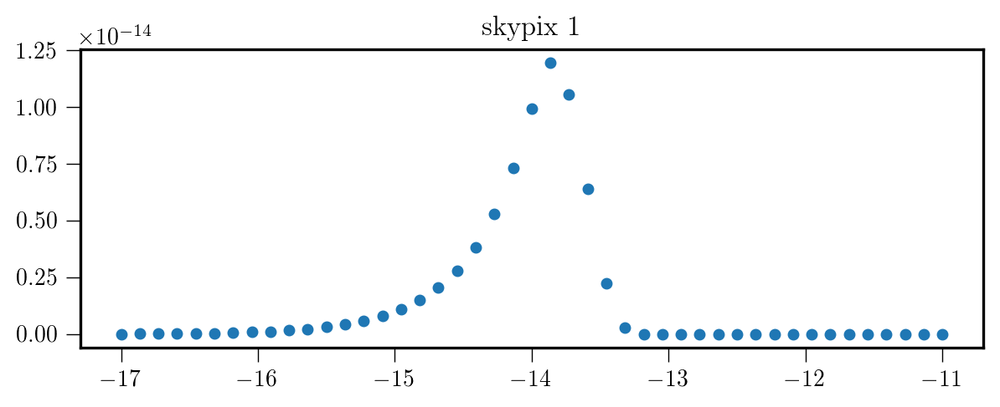

In [28]:
nside=8
npix = hp.nside2npix(nside)
skypixes = np.arange(npix)

p = mp.Pool(processes=15)
p.map(resample_worker, skypixes)

/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax
/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax
/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax
/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax
/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax
/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax
/tmp/ipykernel_31344/84095274.py:34: RuntimeWarning: divide by zero encountered in log
  this_amp_logpost = np.log(this_amp_post) + chartmax
/tmp/ipykerne

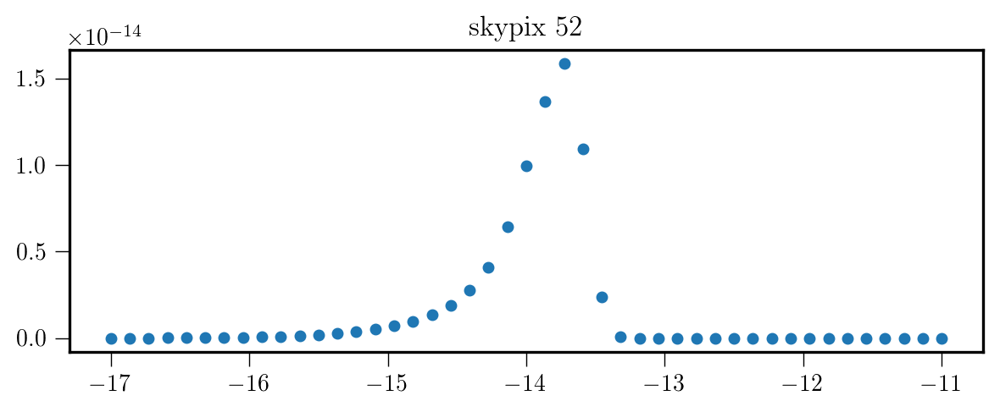

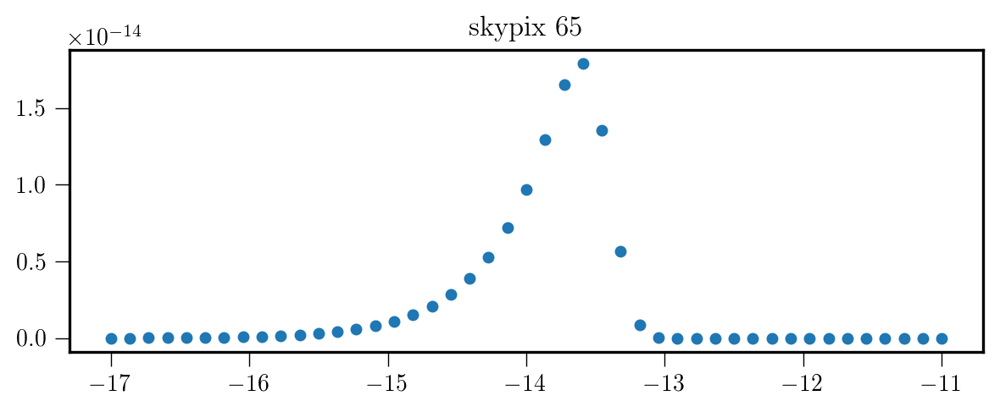

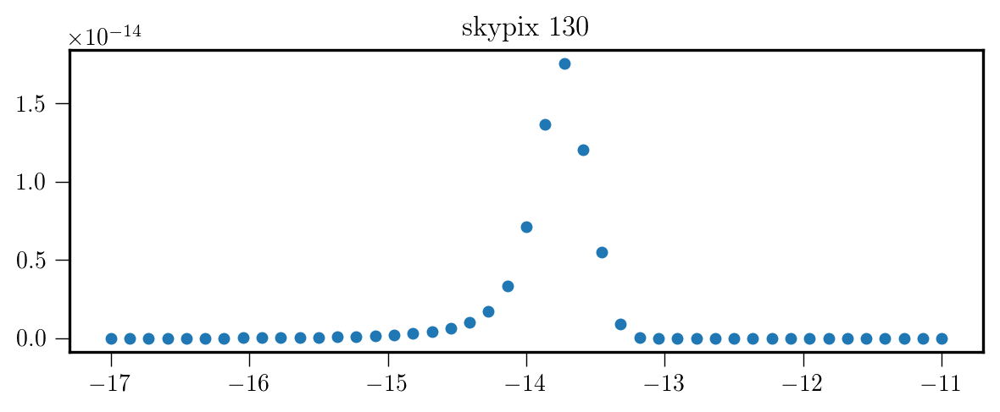

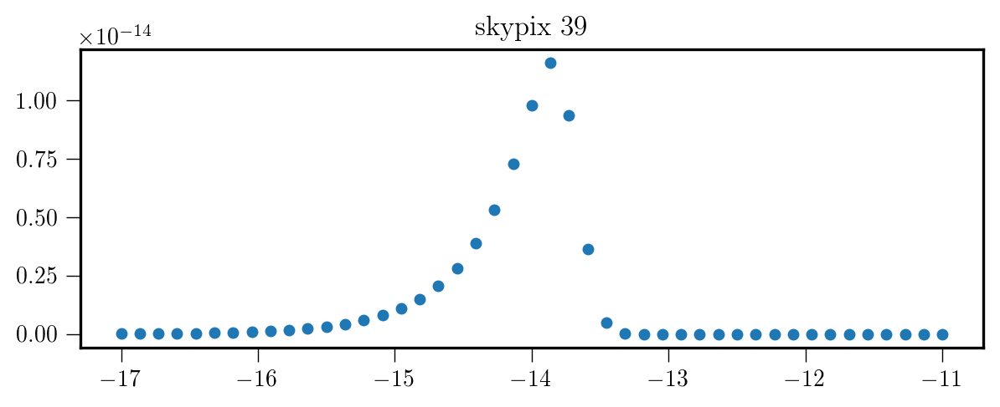

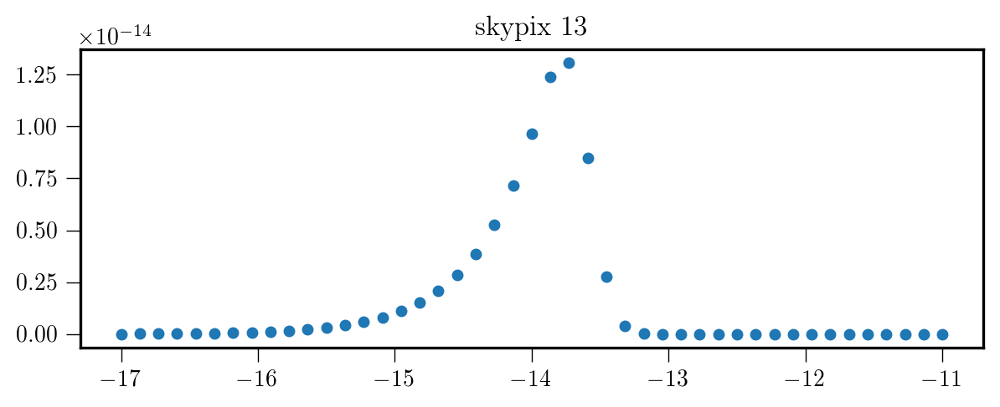

...

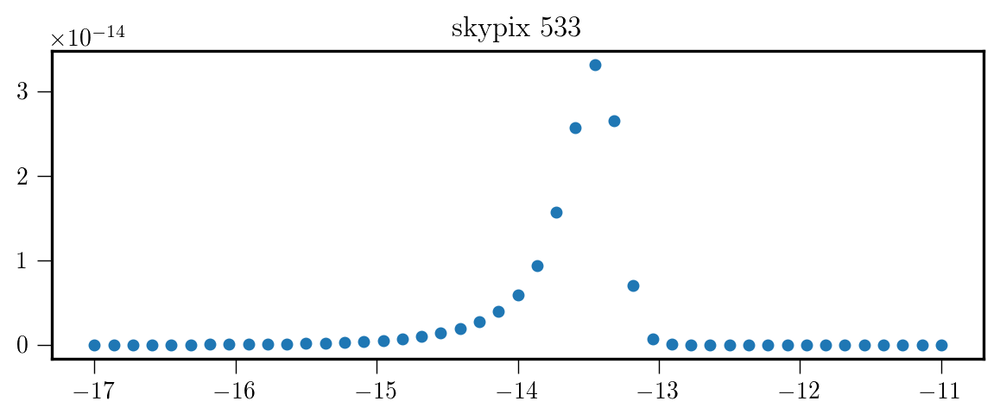

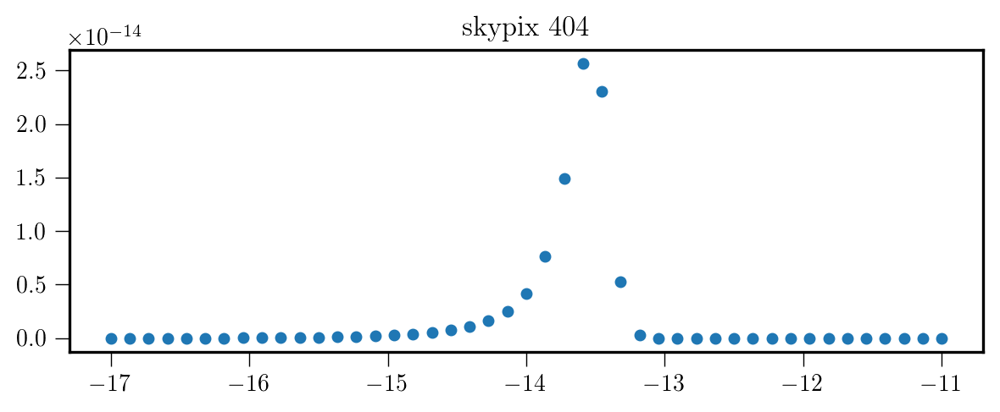

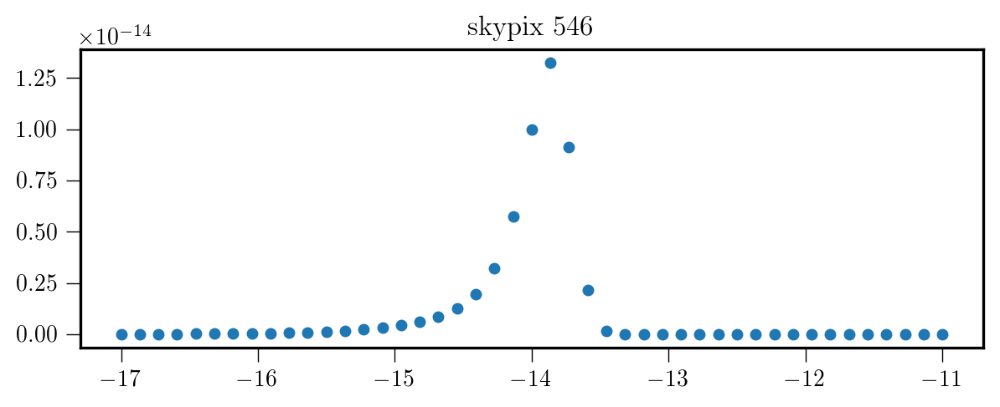

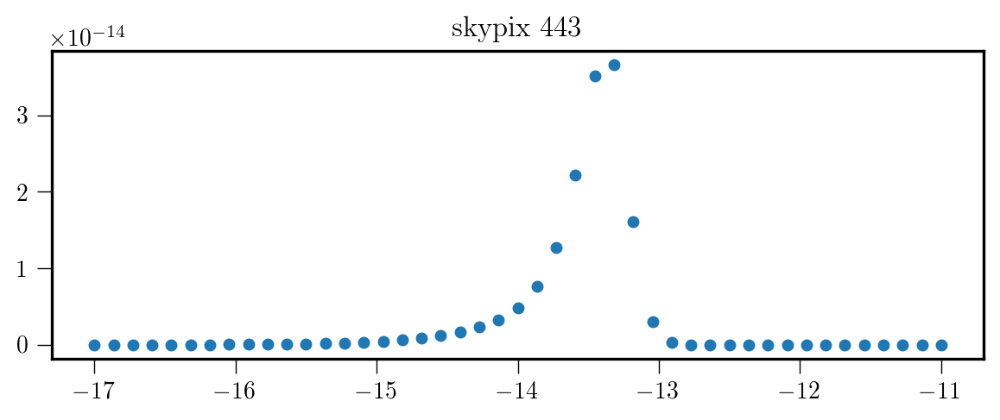

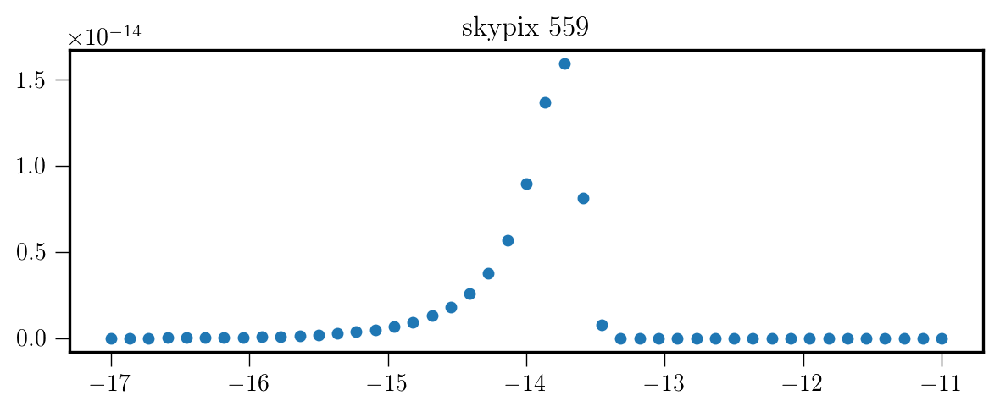

/tmp/ipykernel_31344/84095274.py:33: RuntimeWarning: overflow encountered in exp
  this_amp_post += np.exp(this_pix_chart[amp_idx, t0_idx] - chartmax)


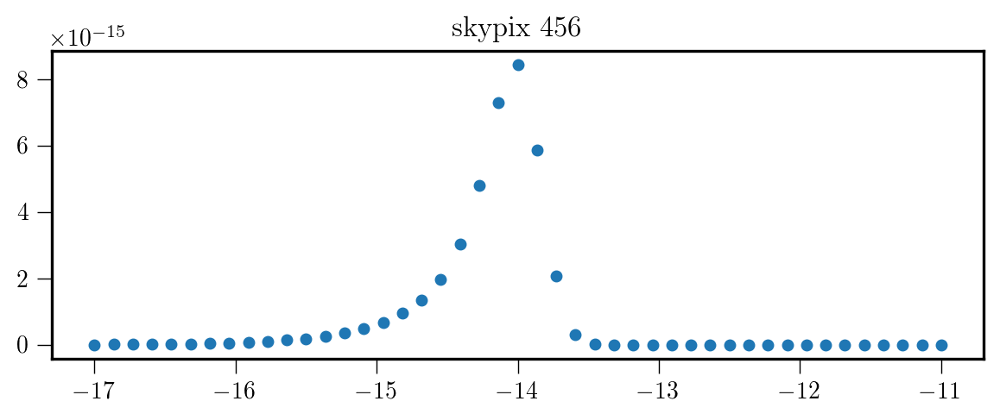

/tmp/ipykernel_31344/84095274.py:42: RuntimeWarning: invalid value encountered in subtract
  weights = np.exp(amp_logposts-normalization)


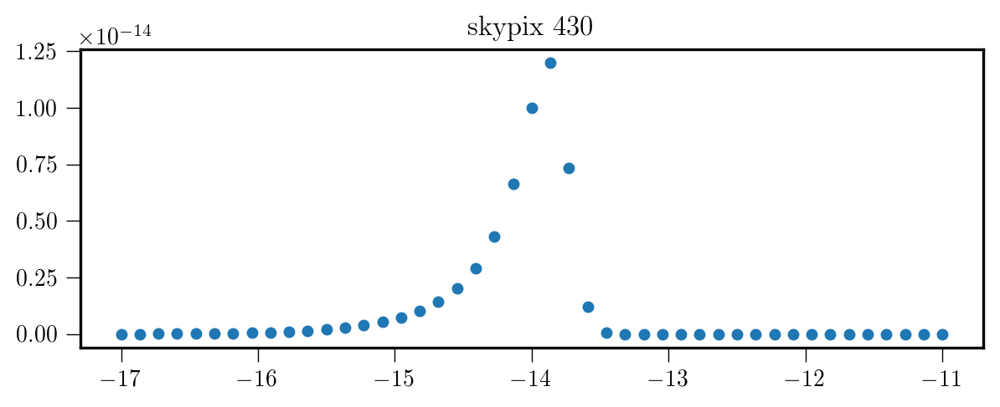

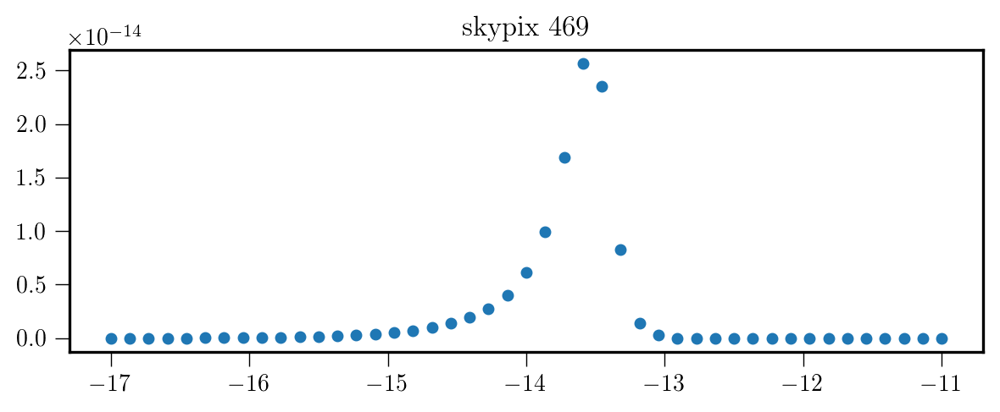

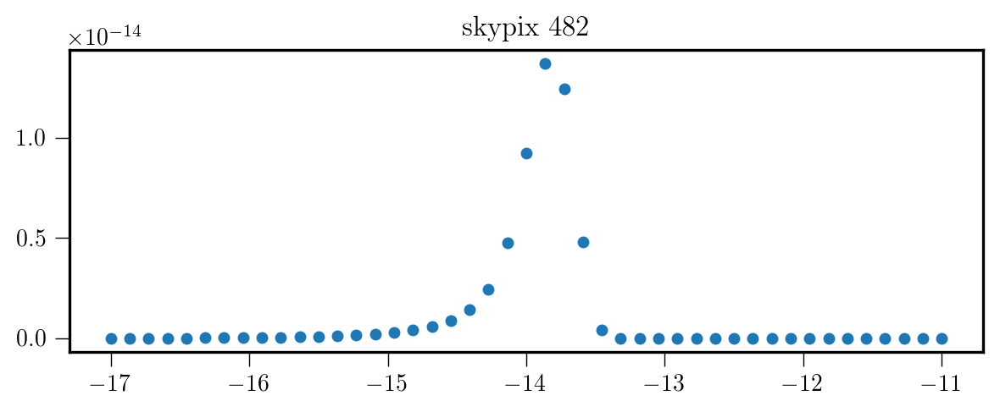

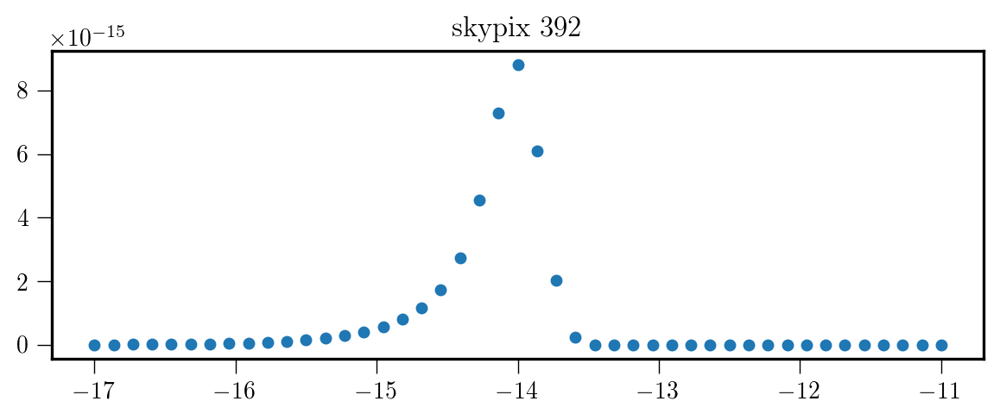

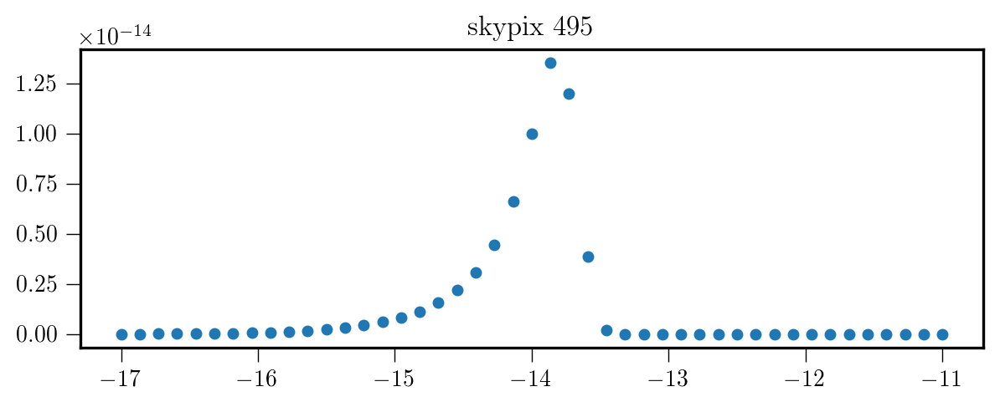

...

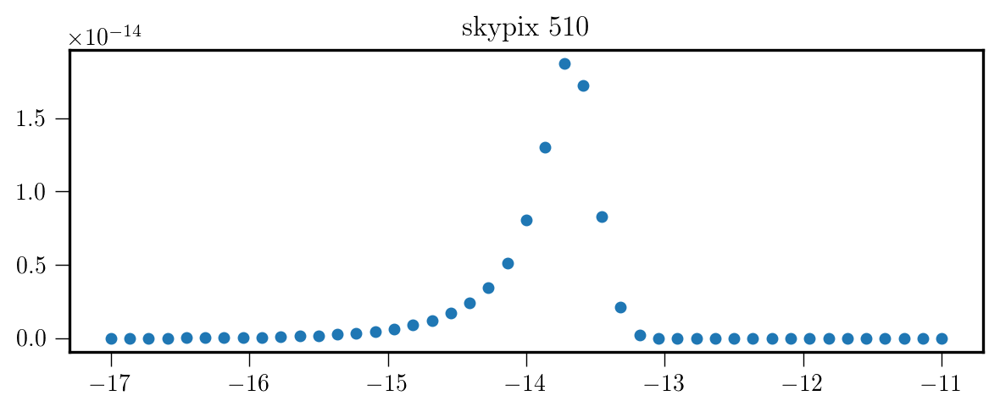

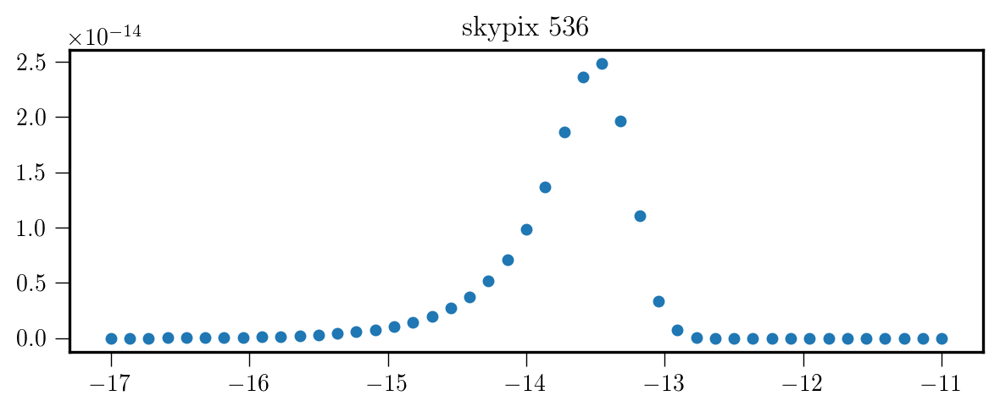

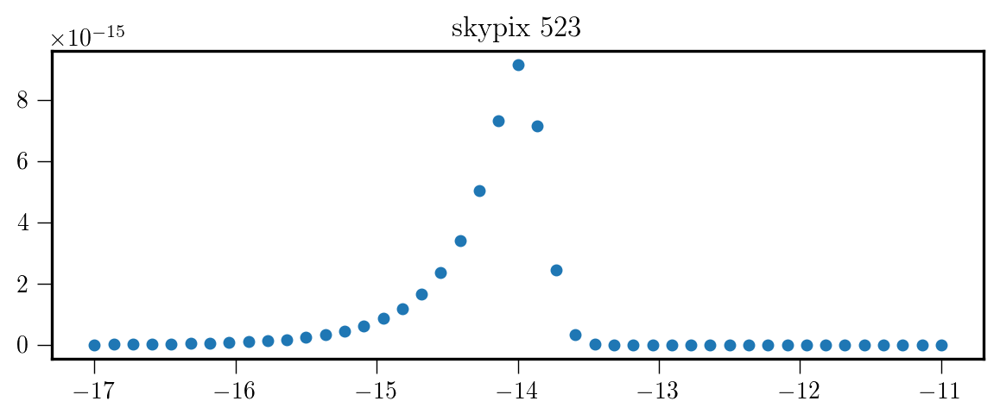

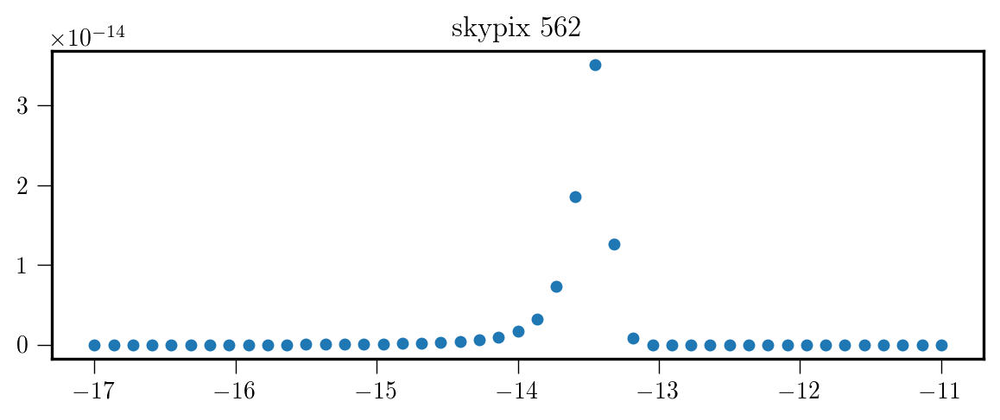

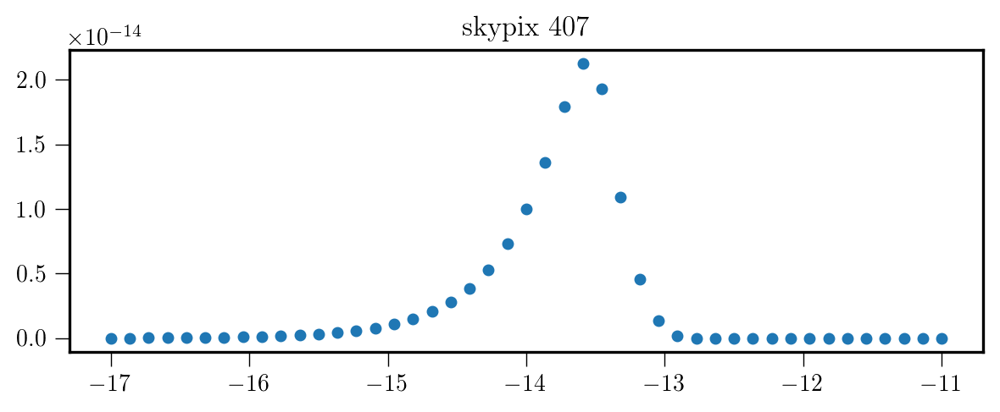

/tmp/ipykernel_31344/84095274.py:33: RuntimeWarning: overflow encountered in exp
  this_amp_post += np.exp(this_pix_chart[amp_idx, t0_idx] - chartmax)


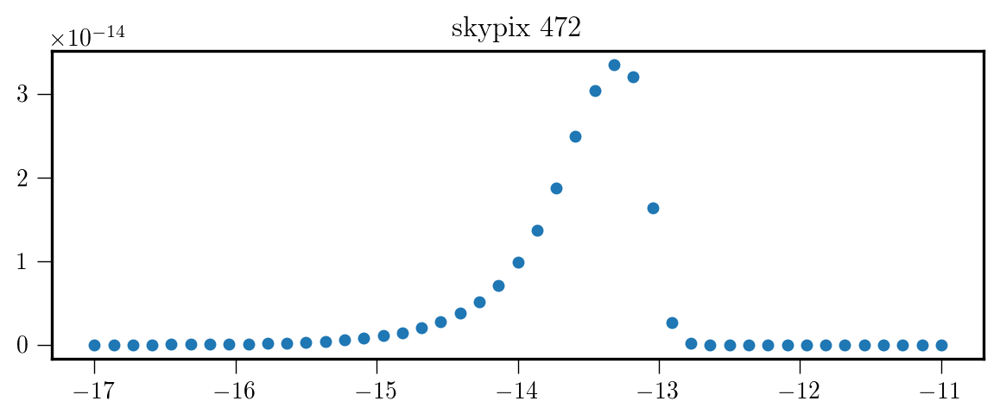

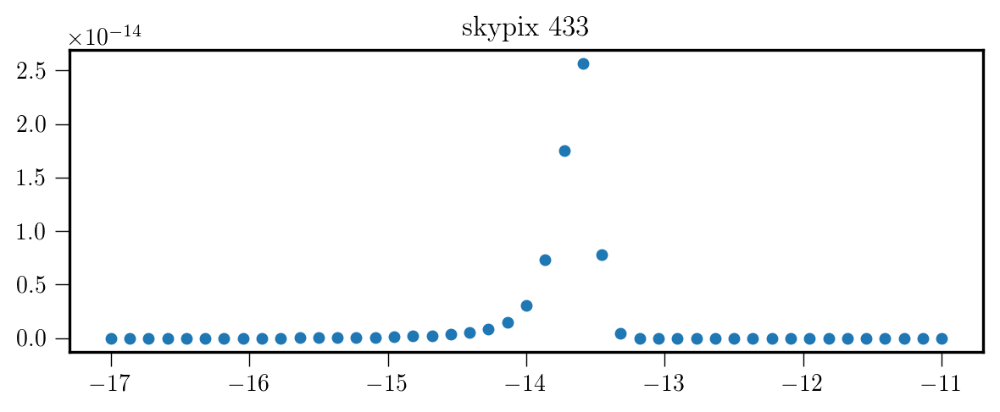

/tmp/ipykernel_31344/84095274.py:42: RuntimeWarning: invalid value encountered in subtract
  weights = np.exp(amp_logposts-normalization)


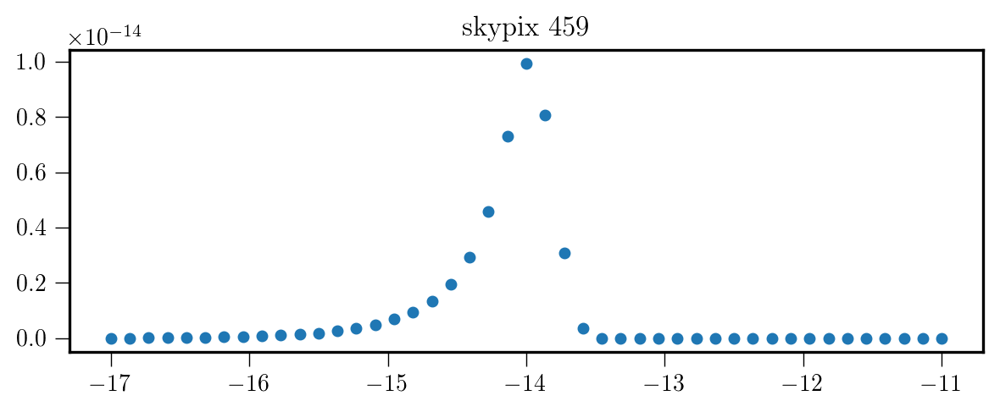

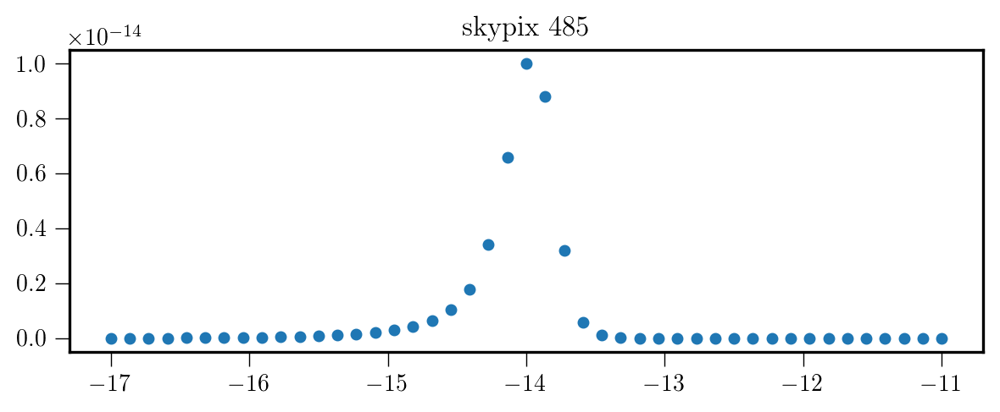

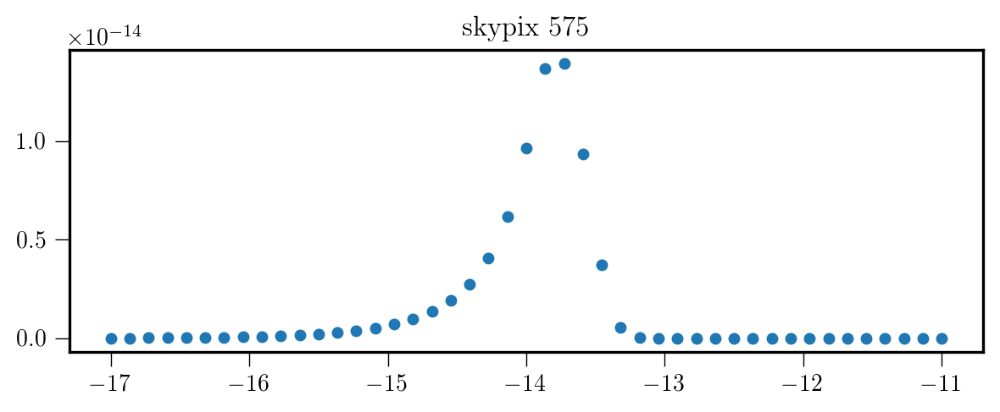

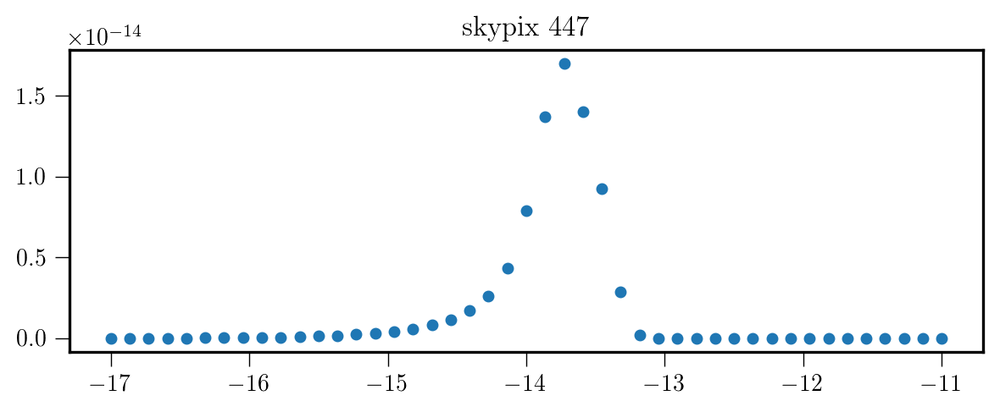

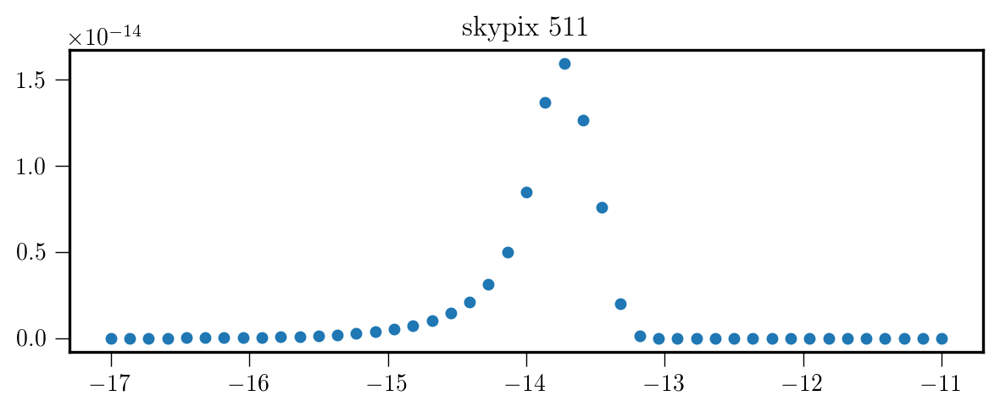

...

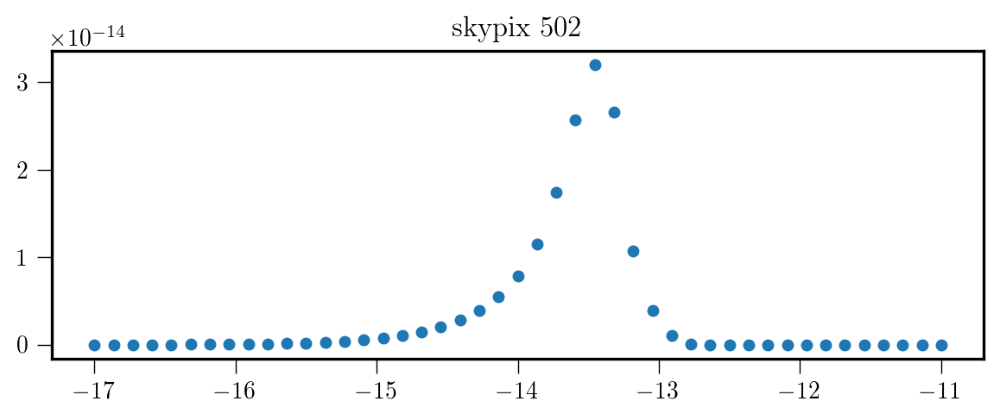

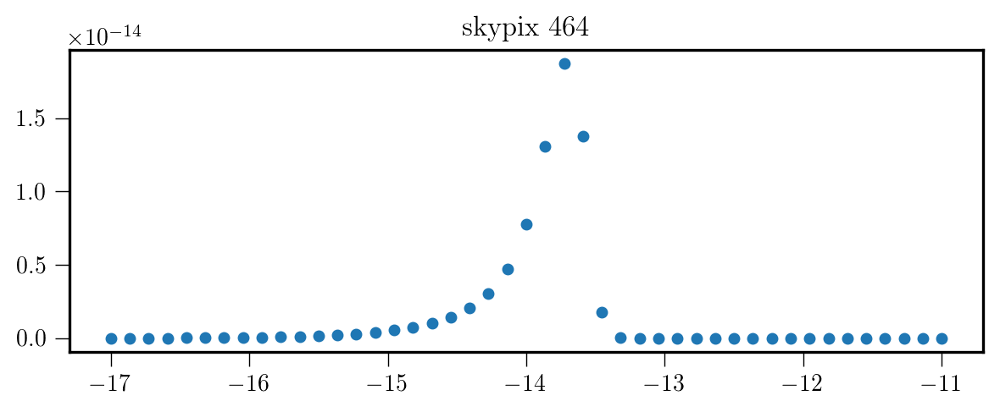

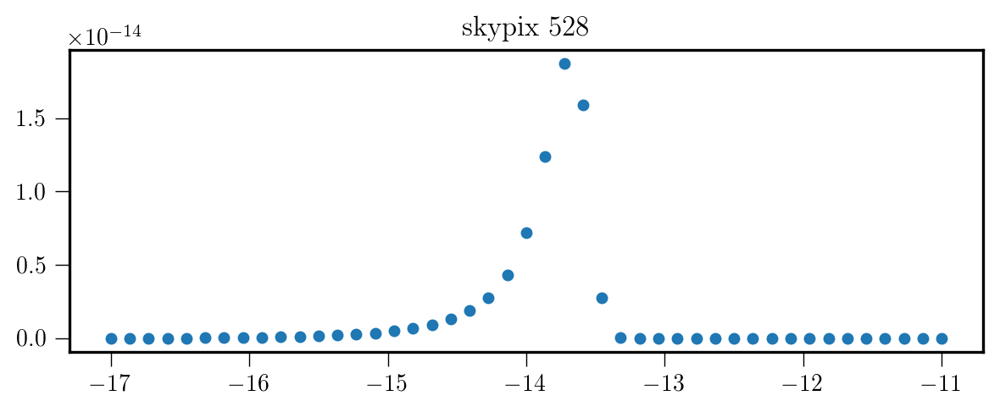

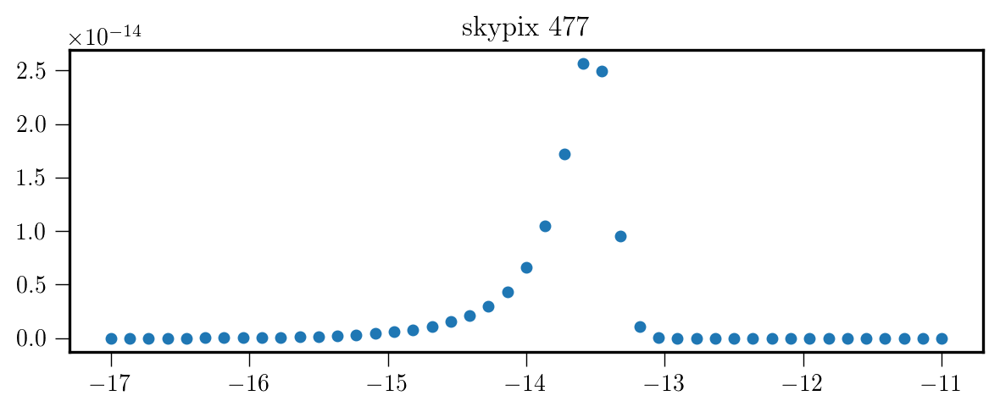

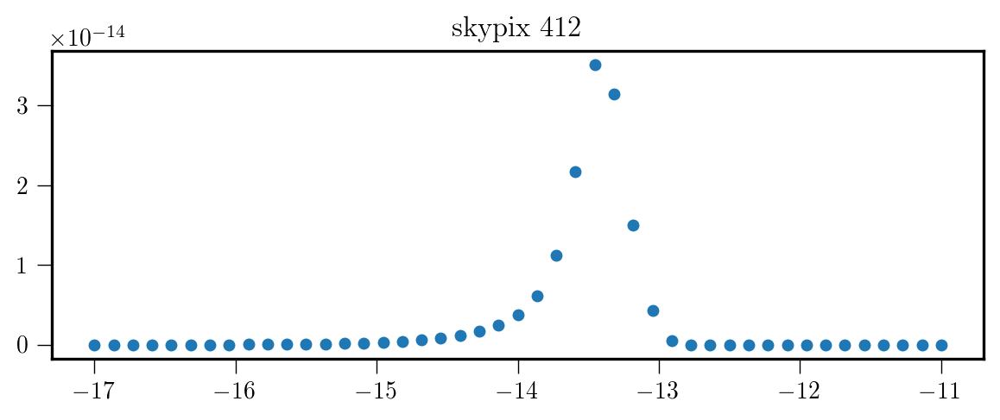

/tmp/ipykernel_31344/84095274.py:33: RuntimeWarning: overflow encountered in exp
  this_amp_post += np.exp(this_pix_chart[amp_idx, t0_idx] - chartmax)


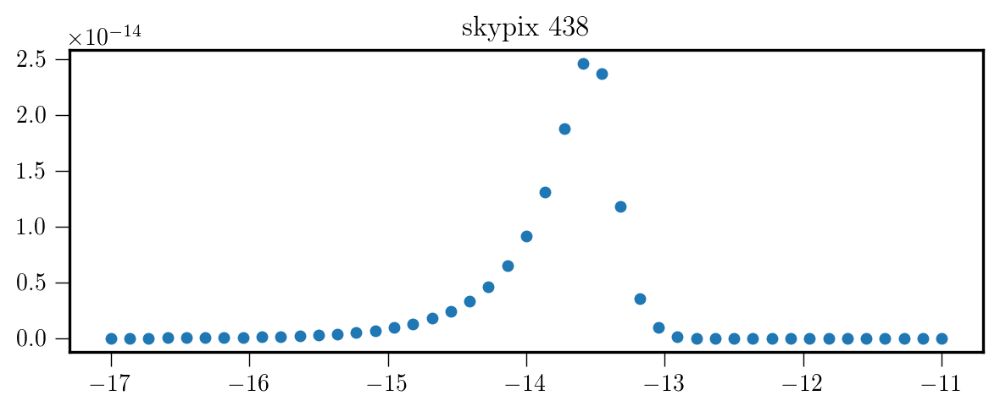

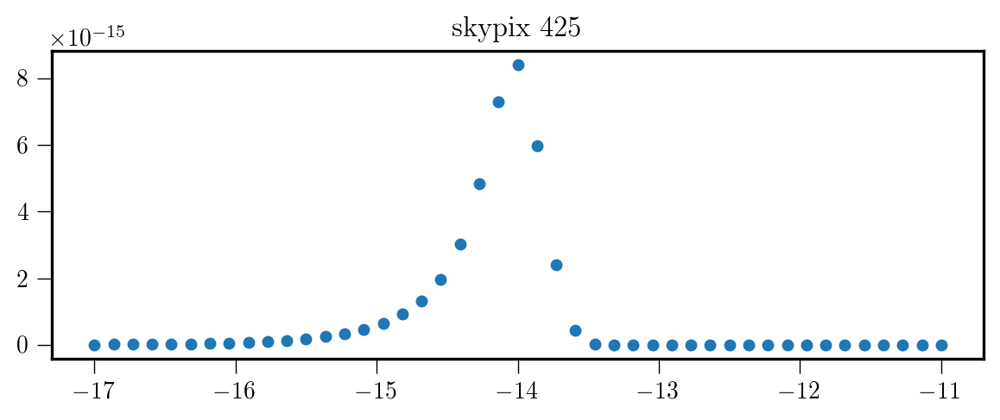

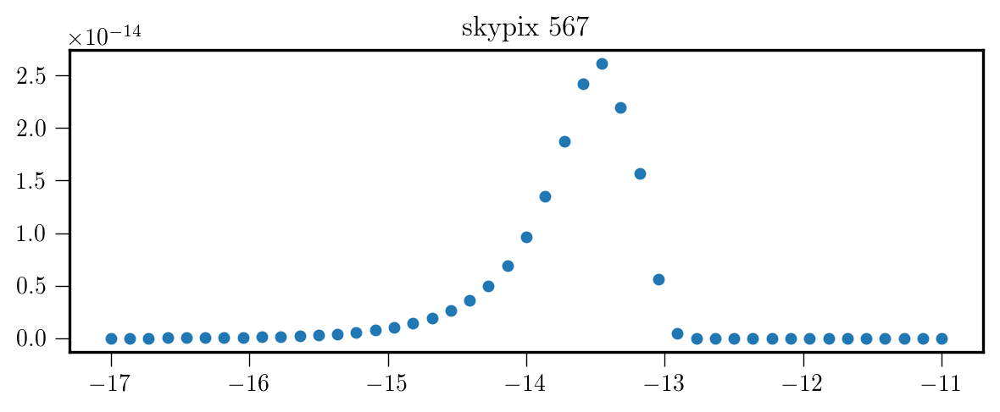

/tmp/ipykernel_31344/84095274.py:42: RuntimeWarning: invalid value encountered in subtract
  weights = np.exp(amp_logposts-normalization)


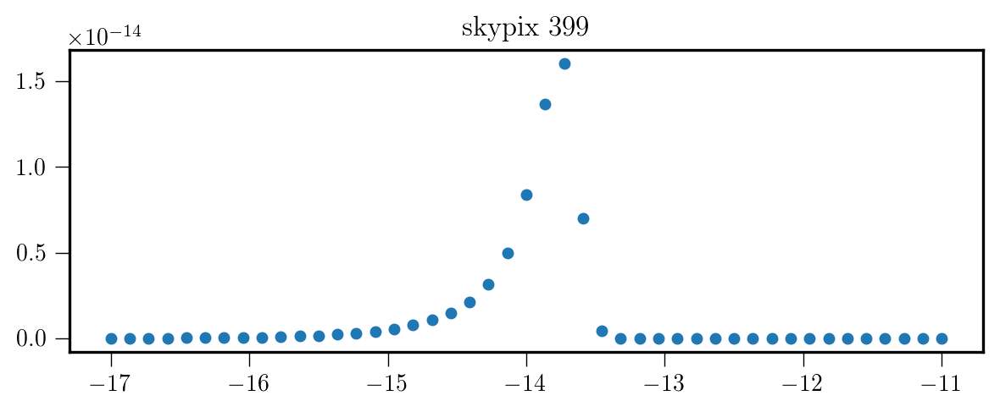

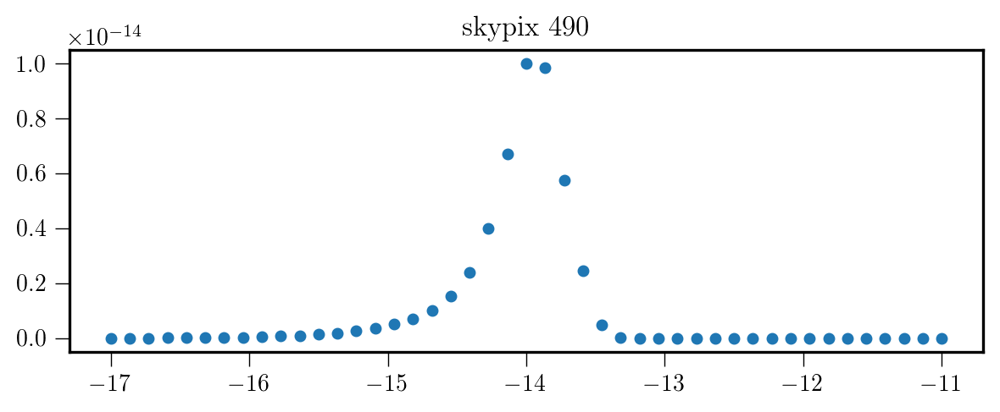

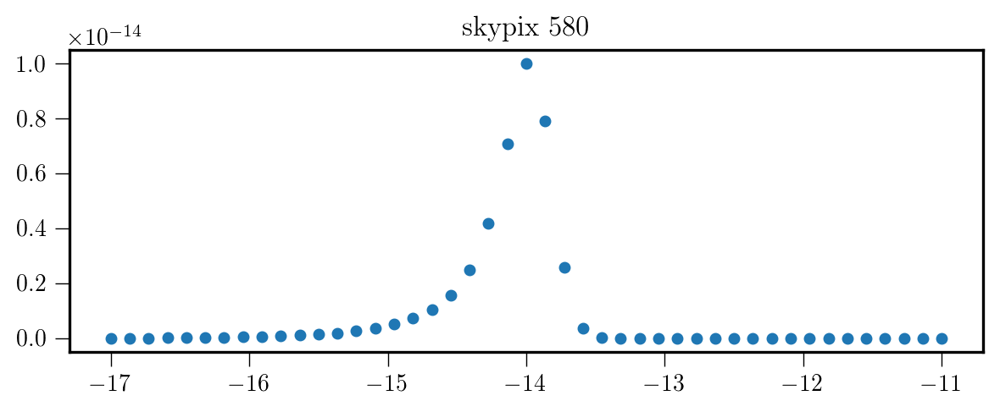

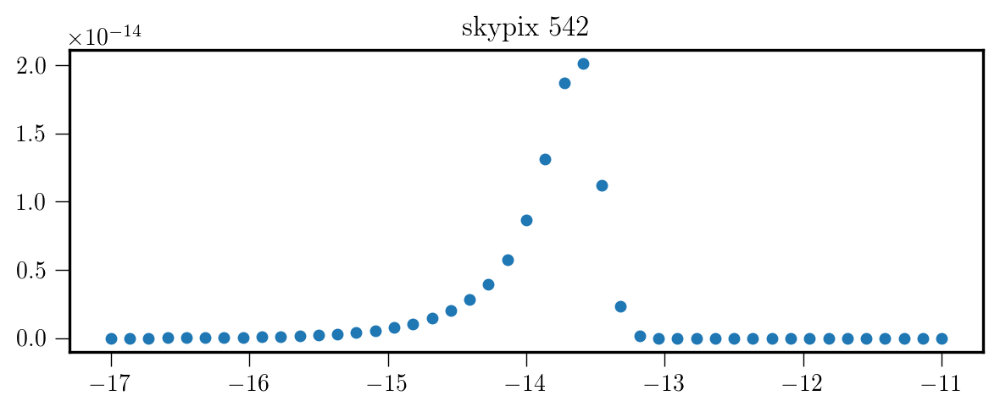

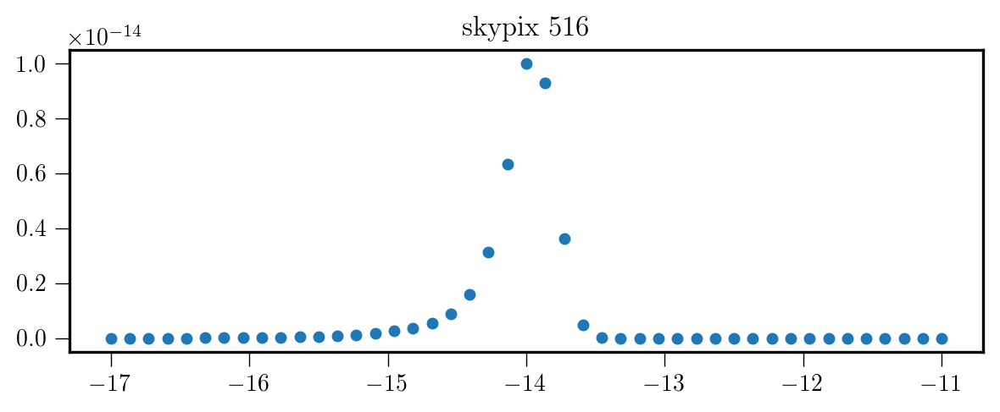

...

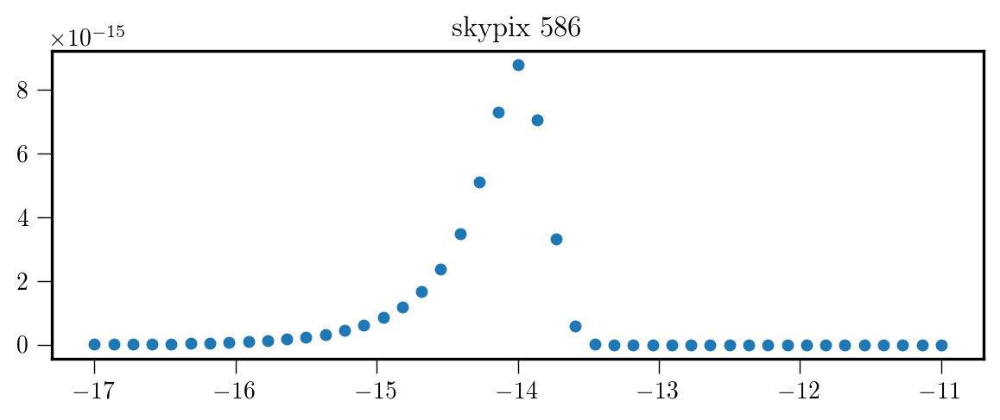

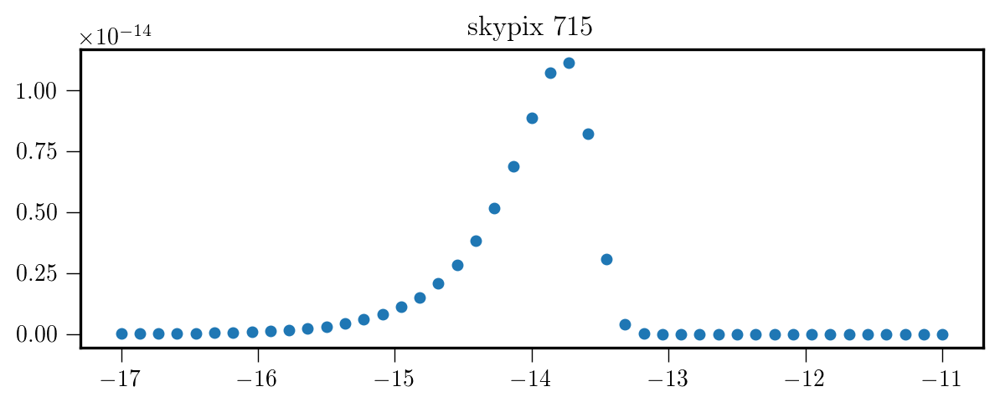

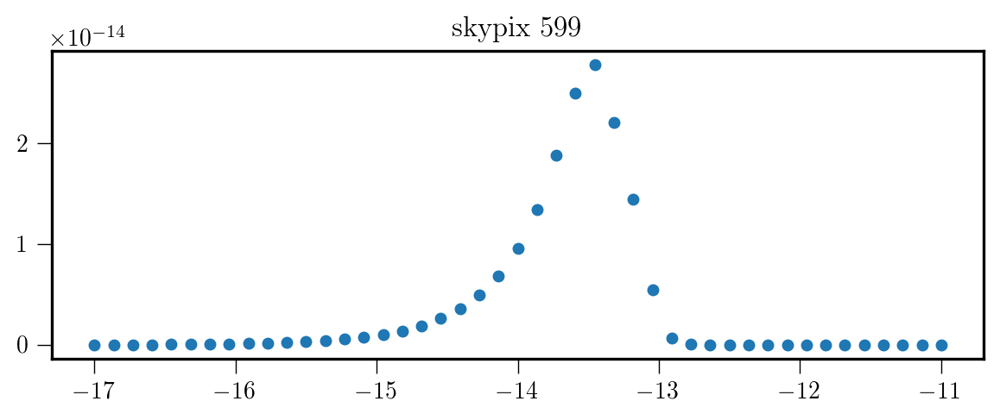

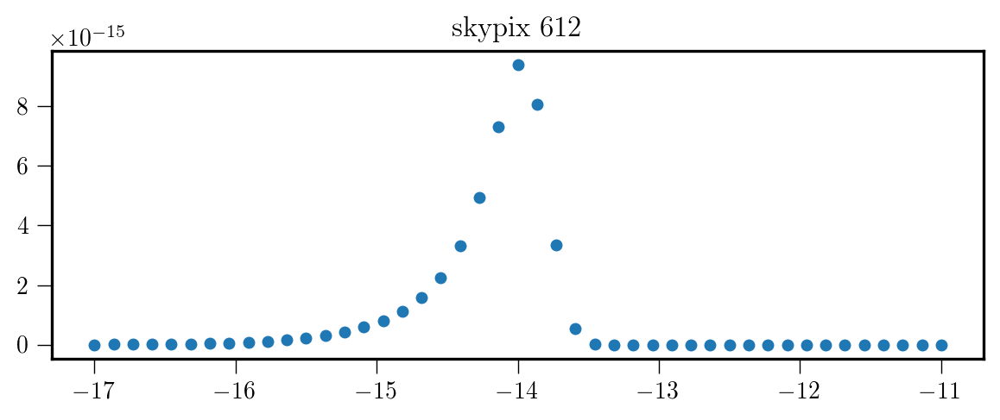

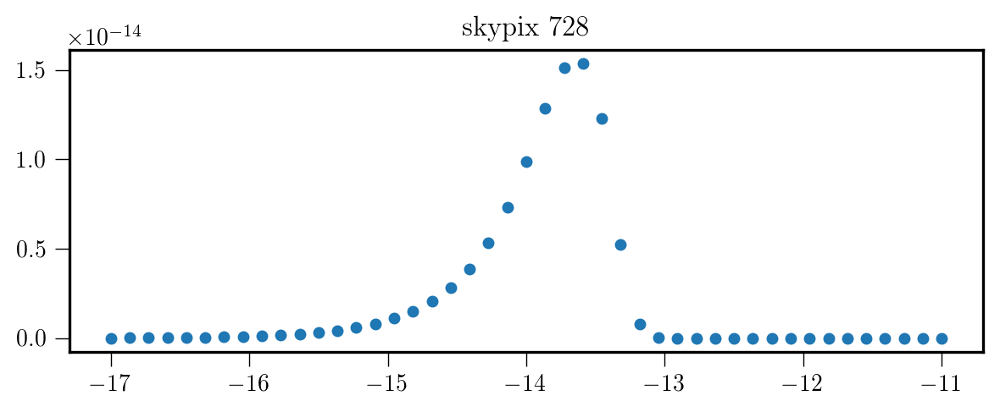

/tmp/ipykernel_31344/84095274.py:33: RuntimeWarning: overflow encountered in exp
  this_amp_post += np.exp(this_pix_chart[amp_idx, t0_idx] - chartmax)
/tmp/ipykernel_31344/84095274.py:42: RuntimeWarning: invalid value encountered in subtract
  weights = np.exp(amp_logposts-normalization)


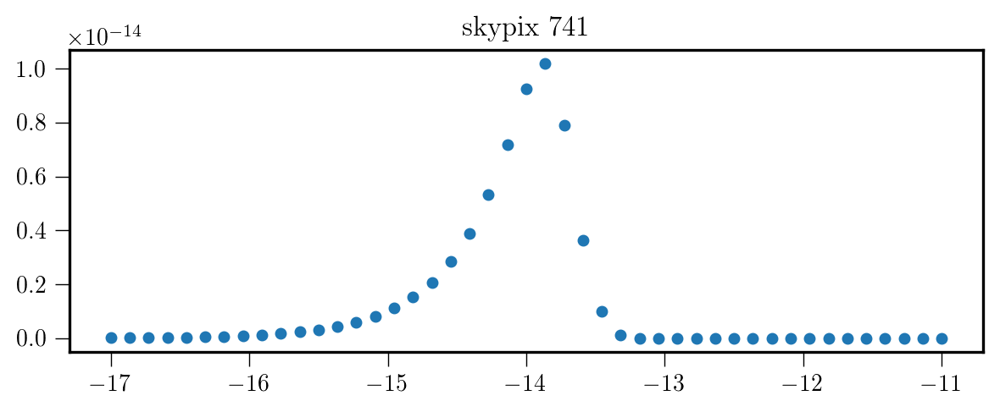

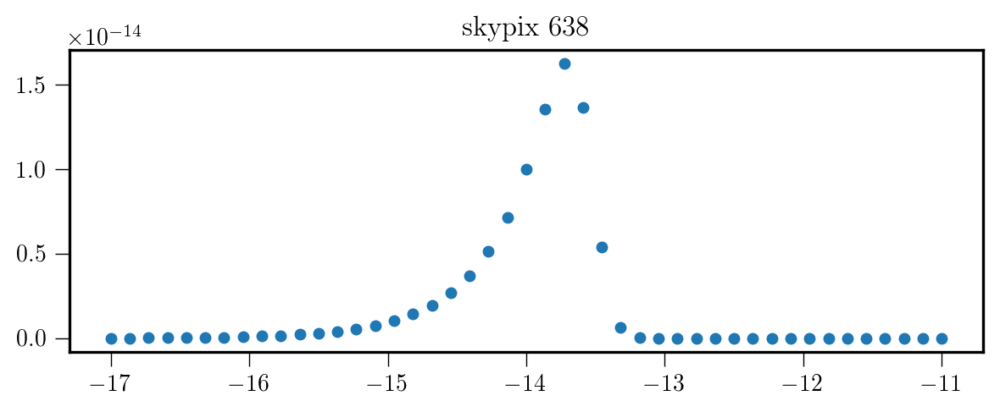

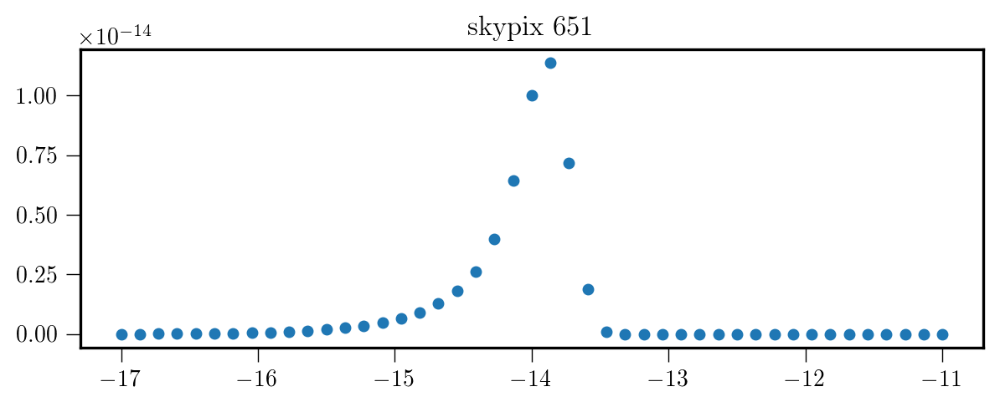

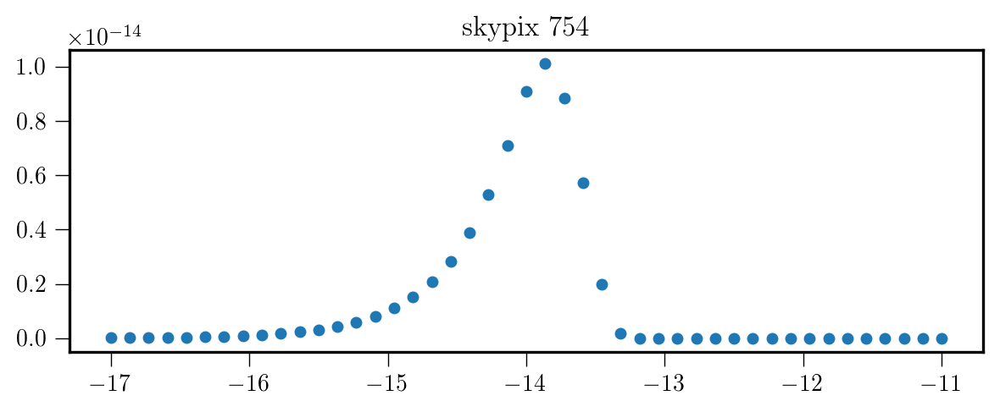

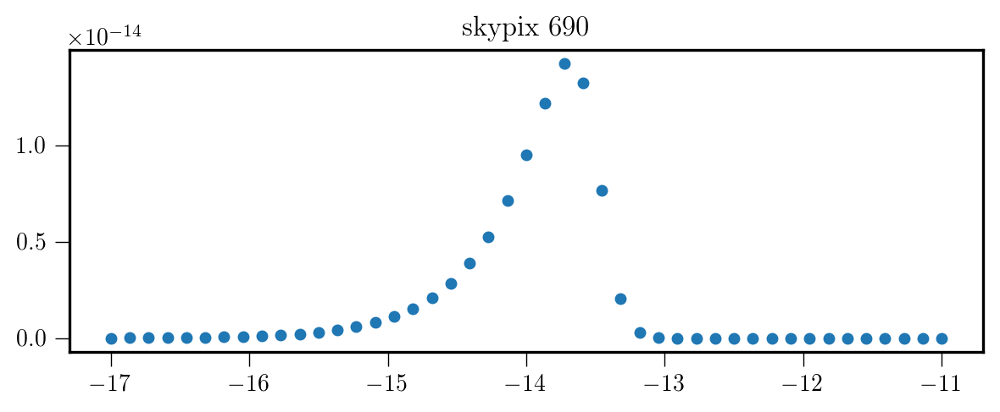

...

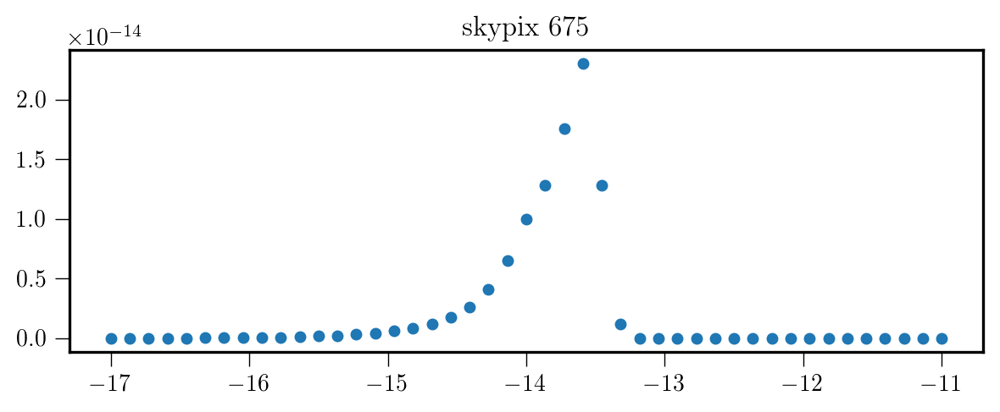

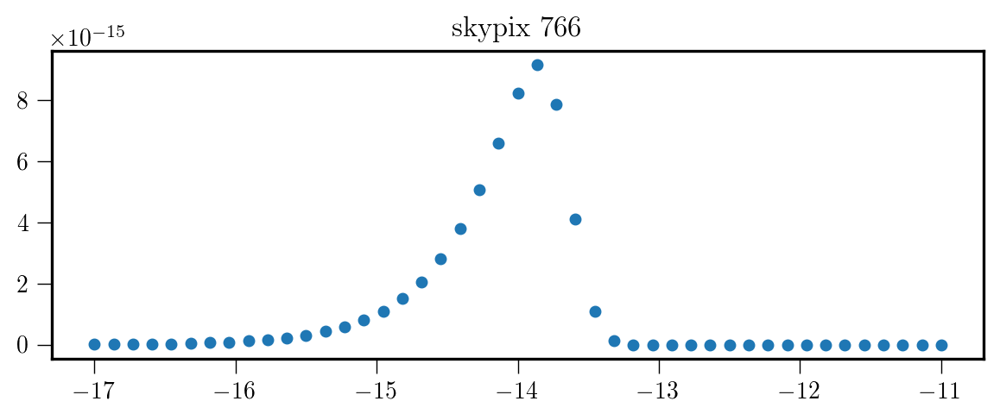

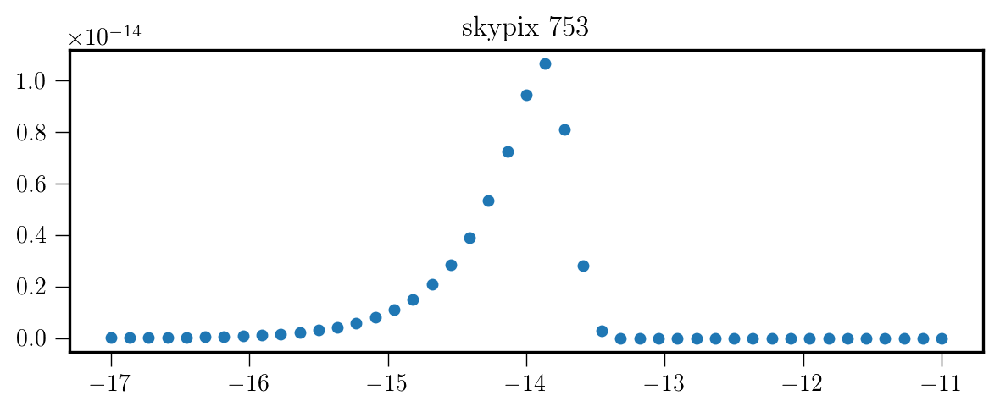

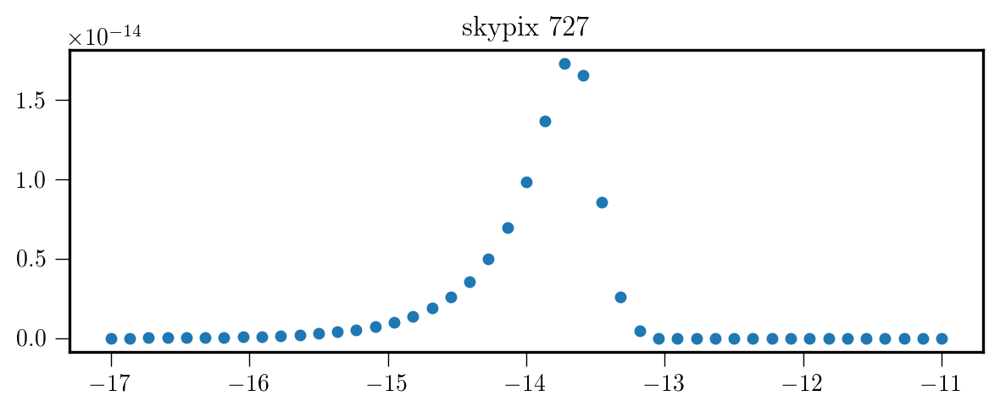

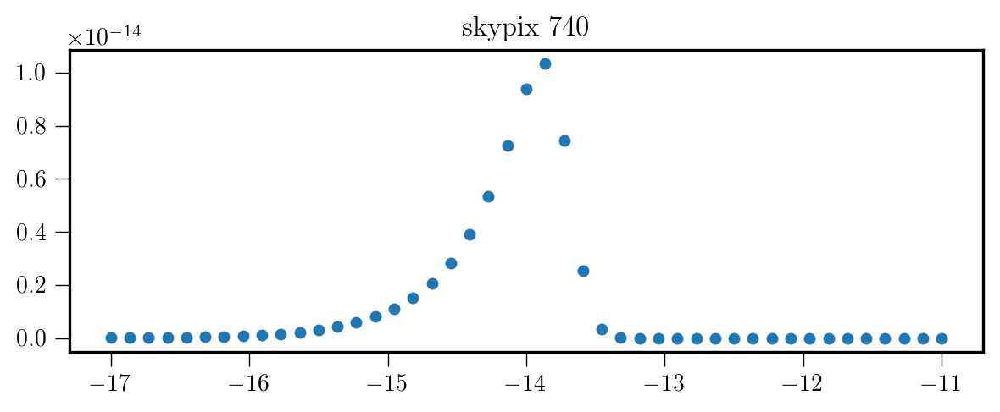

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

Process ForkPoolWorker-89:
Process ForkPoolWorker-90:
Process ForkPoolWorker-77:
Process ForkPoolWorker-81:
Process ForkPoolWorker-83:
Process ForkPoolWorker-79:
Process ForkPoolWorker-85:
Process ForkPoolWorker-84:
Process ForkPoolWorker-86:
Process ForkPoolWorker-78:
Process ForkPoolWorker-87:
Process ForkPoolWorker-76:
Process ForkPoolWorker-80:
Process ForkPoolWorker-88:
Process ForkPoolWorker-82:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/home/nima/anaconda3/envs/

  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
KeyboardInterrupt
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
KeyboardInterrupt
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "/home/nima/anaconda3/envs/nano15/lib/python3.8/multiprocessing

In [29]:
nside=8
npix = hp.nside2npix(nside)
skypixes = np.arange(npix)

p = mp.Pool(processes=15)
p.map(resample_worker, skypixes)

# Load and plot


In [106]:
skypix_histdir = '/home/nima/nanograv/12p5yr_bwm/ULv/'
nside = 8
npix = hp.nside2npix(nside)

UL_skymap = np.zeros(npix)

for skypix in range(npix):
    try:
        skypix_hist = sorted(np.loadtxt(skypix_histdir + "{}_hist.txt".format(skypix)))
        idx_95 = int(0.95 * len(skypix_hist))
        UL_skymap[skypix] = skypix_hist[idx_95]
    except OSError:
        print("Could not find samples for skypixel {}".format(skypix))
        UL_skymap[skypix] = 5e-13

In [107]:
nano12_psrlocs = []
for p in allpsrs:
    ## locations are given in [phi, costheta]
    theta, phi = hp.vec2ang(p.pos)
    psrloc = [phi[0], np.cos(theta[0])]

    nano12_psrlocs.append(psrloc)
nano12_psrlocs = np.array(nano12_psrlocs)


In [108]:
UL_skymap

array([-13.4699669 , -13.45251118, -13.45008703, -13.49589179,
       -13.49307849, -13.44908421, -13.40714454, -13.3737152 ,
       -13.40390951, -13.49510403, -13.52554403, -13.52662563,
       -13.50043466, -13.42241833, -13.40122753, -13.40310053,
       -13.27871149, -13.17400336, -13.36750534, -13.43118098,
       -13.51569593, -13.57104673, -13.56811158, -13.55208198,
       -13.5049061 , -13.45488533, -13.4106042 , -13.39248249,
       -13.36151238, -13.29606191, -13.19441444, -13.12187189,
       -13.17720388, -13.26791877, -13.40160554, -13.58370443,
       -13.61127707, -13.57802473, -13.57975714, -13.53836834,
       -13.53584041, -13.49169903, -13.36658057, -13.34274085,
       -13.31853255, -13.33533301, -13.30652965, -13.20215456,
       -13.28270589, -13.15919345, -13.22420793, -13.35407225,
       -13.46356932, -13.54680736, -13.59508237, -13.65222164,
       -13.64700169, -13.62388199, -13.55166905, -13.55339439,
       -13.51965614, -13.45035369, -13.38475844, -13.31

min = 1e-14; max = 2e-13


/home/nima/anaconda3/envs/nano15/lib/python3.8/site-packages/matplotlib/projections/geo.py:394: RuntimeWarning: invalid value encountered in arcsin
  theta = np.arcsin(y / np.sqrt(2))
/home/nima/nanograv/12p5yr_bwm/skyplot_tools.py:498: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("viridis_r").copy()
  aximg.cmap.set_bad('w', alpha=0.)


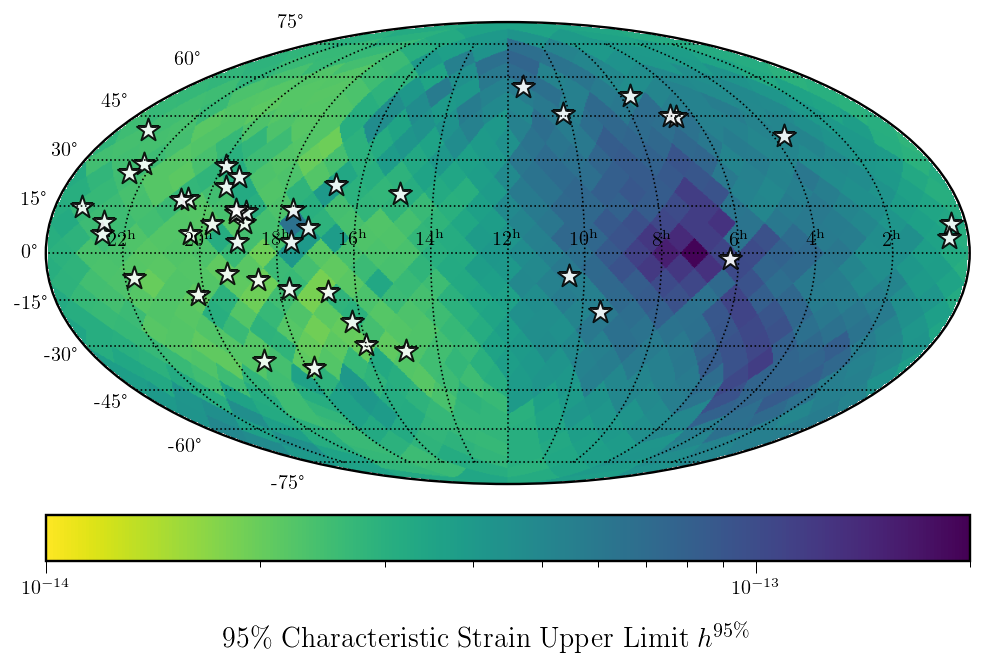

In [109]:
print("min = 1e-14; max = 2e-13")

zmin = 1e-14
zmax = 2e-13
skymap_exp = 10**UL_skymap
norm=LogNorm(vmin=zmin, vmax=zmax)

plt.close('all')
plt.figure(0, figsize=(7, 5))
ax = plt.subplot(111, projection='astro mollweide', )
ax.grid()
#spt.outline_text(ax)

spt.healpix_heatmap(skymap_exp, cmap='viridis_r', norm=LogNorm(vmin=zmin, vmax=zmax),)

ax.scatter(nano12_psrlocs[:,0], nano12_psrlocs[:,1], 12**2,
          marker='*', facecolor='w', edgecolors='k', alpha=0.9)

cbar = plt.colorbar(orientation='horizontal', pad=0.05)
plt.suptitle('95\% Characteristic Strain Upper Limit $h^{95\%}$', y=0.01, fontweight='heavy', fontsize=14,)
#plt.suptitle(, y=0.05)
plt.grid(linestyle='dotted', color='k')
plt.tight_layout()
plt.show()

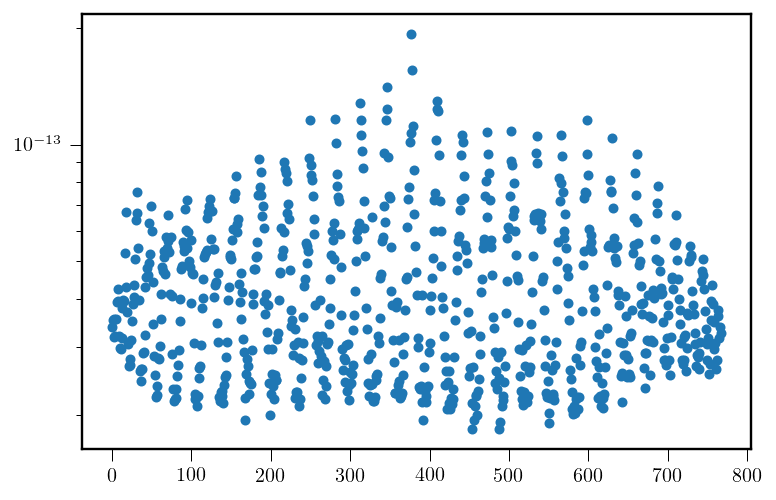

In [110]:
plt.scatter(skypixes,skymap_exp)
plt.yscale('log')
plt.show()

# Comparing against 11yr factlike results

# Scratch work to determine location of skypixels


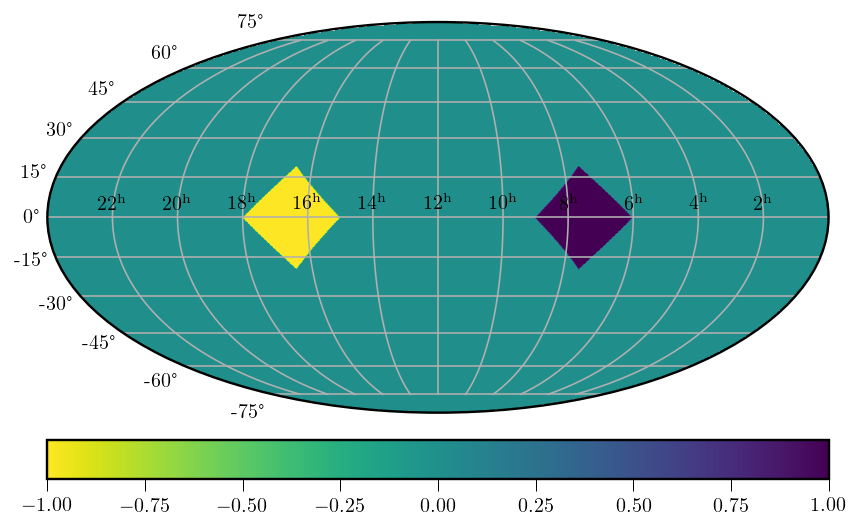

In [131]:
dummy_skymap = np.zeros(hp.nside2npix(2))

dummypix_a = 25
dummy_skymap[dummypix_a] = -1

dummypix_b = 22
dummy_skymap[dummypix_b] = 1


zmin = -1
zmax = 1

norm=Normalize(vmin=zmin, vmax=zmax)

plt.close('all')
plt.figure(0, figsize=(7, 5))
ax = plt.subplot(111, projection='astro mollweide', )
ax.grid()
#spt.outline_text(ax)

spt.healpix_heatmap(dummy_skymap, cmap='viridis_r', norm=norm,)
cbar = plt.colorbar(orientation='horizontal', pad=0.05)

In [ ]:
# We'll use dummypixels 390 and 375



Now we'll need to compute the UL vs T for both of these skypixels using the 12p5yr data both marginalized and not-marginalized over CRN. We want to see if the CRN makes things worse in the bad skypixel and better in the good skypixels

In [ ]:
good_chartdir_crnmarg = '/home/nima/nanograv/12p5yr_bwm/ULvT_charts_crnmarg/'
good_chartdir = '/home/nima/nanograv/12p5yr_bwm/ULvT_charts/'

